<a href="https://colab.research.google.com/github/bboszori/ds_assesment/blob/main/03_regression_homework_bboszori.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Regression (basic) homework

## Overview

* Regression analysis of Air Quality dataset
* Target - C6H6(GT)
* -200 indicates missing values



---



**Quality of delivered work:**
* Analytical comments provided (5%)
* The experiment is structured: file is readable, pictures have titles, etc (5%)
* Code is clear (reusable code in functions, comments,
* code is easy readable) (5%)
* Extra points for improvements not considered in the criteria (10%)


In [ ]:
pip install pandas_profiling

In [ ]:
import pandas as pd
import numpy as np
import os
import random
import warnings
warnings.filterwarnings('ignore')

import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
from statistics import mean
import statsmodels.api as sm
from scipy.stats import normaltest
from statsmodels.stats.outliers_influence import variance_inflation_factor

from pandas_profiling import ProfileReport
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold, TimeSeriesSplit, cross_val_predict
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.preprocessing import MinMaxScaler, PolynomialFeatures
from sklearn.impute import SimpleImputer

from sklearn.pipeline import Pipeline, make_pipeline
from sklearn_pandas import DataFrameMapper, gen_features
from sklearn import metrics
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.base import clone

plt.rcParams['figure.figsize'] = 10, 7
plt.style.use('ggplot')

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
! ls '/content/gdrive/MyDrive/Data_Science_mentoring/04_regression_1/homework/data'

AirQualityUCI.csv  dataset_description.gdoc


In [ ]:
# Commonly used constants and paths
SEED = 42
DATA_PATH = '/content/gdrive/MyDrive/Data_Science_mentoring/04_regression_1/homework/data'
TRAIN_PATH = f'{DATA_PATH}/AirQualityUCI.csv'
DESCRIPTION = f'{DATA_PATH}/dataset_description.gdoc'
TARGET = 'C6H6(GT)'

In [ ]:
data = pd.read_csv(TRAIN_PATH, delimiter=';', parse_dates={'date_time':['Date', 'Time']})

## EDA: exploration of variables and properties of data with conclusions (10%)


In [ ]:
data.head()

,date_time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
0,10/03/2004 18.00.00,"2,6",1360.0,150.0,"11,9",1046.0,166.0,1056.0,113.0,1692.0,1268.0,"13,6","48,9","0,7578",NaN,NaN
1,10/03/2004 19.00.00,2,1292.0,112.0,"9,4",955.0,103.0,1174.0,92.0,1559.0,972.0,"13,3","47,7","0,7255",NaN,NaN
2,10/03/2004 20.00.00,"2,2",1402.0,88.0,"9,0",939.0,131.0,1140.0,114.0,1555.0,1074.0,"11,9","54,0","0,7502",NaN,NaN
3,10/03/2004 21.00.00,"2,2",1376.0,80.0,"9,2",948.0,172.0,1092.0,122.0,1584.0,1203.0,"11,0","60,0","0,7867",NaN,NaN
4,10/03/2004 22.00.00,"1,6",1272.0,51.0,"6,5",836.0,131.0,1205.0,116.0,1490.0,1110.0,"11,2","59,6","0,7888",NaN,NaN


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date_time      9471 non-null   object 
 1   CO(GT)         9357 non-null   object 
 2   PT08.S1(CO)    9357 non-null   float64
 3   NMHC(GT)       9357 non-null   float64
 4   C6H6(GT)       9357 non-null   object 
 5   PT08.S2(NMHC)  9357 non-null   float64
 6   NOx(GT)        9357 non-null   float64
 7   PT08.S3(NOx)   9357 non-null   float64
 8   NO2(GT)        9357 non-null   float64
 9   PT08.S4(NO2)   9357 non-null   float64
 10  PT08.S5(O3)    9357 non-null   float64
 11  T              9357 non-null   object 
 12  RH             9357 non-null   object 
 13  AH             9357 non-null   object 
 14  Unnamed: 15    0 non-null      float64
 15  Unnamed: 16    0 non-null      float64
dtypes: float64(10), object(6)
memory usage: 1.2+ MB


In [ ]:
# replace commas and parse fields to float
str_cols = ['CO(GT)','C6H6(GT)', 'T','RH','AH']
data[str_cols] = data[str_cols].replace(',', '.', regex=True).astype(float)

In [ ]:
#replace -200 with nan
for col in data.columns:
  data[col] = data[col].replace(-200, np.nan)

In [ ]:
data[data['date_time']=='nan nan']

,date_time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
9357,nan nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9358,nan nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9359,nan nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9360,nan nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9361,nan nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9466,nan nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9467,nan nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9468,nan nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9469,nan nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# remove empty rows
data = data[data['date_time']!='nan nan']

In [ ]:
data['date_time']= pd.to_datetime(data['date_time'], format='%d/%m/%Y %H.%M.%S')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9357 entries, 0 to 9356
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   date_time      9357 non-null   datetime64[ns]
 1   CO(GT)         7674 non-null   float64       
 2   PT08.S1(CO)    8991 non-null   float64       
 3   NMHC(GT)       914 non-null    float64       
 4   C6H6(GT)       8991 non-null   float64       
 5   PT08.S2(NMHC)  8991 non-null   float64       
 6   NOx(GT)        7718 non-null   float64       
 7   PT08.S3(NOx)   8991 non-null   float64       
 8   NO2(GT)        7715 non-null   float64       
 9   PT08.S4(NO2)   8991 non-null   float64       
 10  PT08.S5(O3)    8991 non-null   float64       
 11  T              8991 non-null   float64       
 12  RH             8991 non-null   float64       
 13  AH             8991 non-null   float64       
 14  Unnamed: 15    0 non-null      float64       
 15  Unnamed: 16    0 non-

In [ ]:
ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

* There are multiple feutures with skewed distribution, so it is better to use MinMaxScaler
* There are strong correlation between multiple features. It is better to use a model, that can handel multicollinearity
* PT08.S2(NMHC) has a very high correlation coefficient (almost 1)
* There are some columns ('NMHC(GT)', 'Unnamed: 15', 'Unnamed: 16') with high number of missing values

## Data preparation: all missing values are filled/dropped with explanation of why some method was chosen (10%)


In [ ]:
# dropping columns with mostly null values
data.drop(columns=['NMHC(GT)', 'Unnamed: 15', 'Unnamed: 16'], inplace=True)

In [ ]:
data.set_index('date_time',inplace=True)

In [ ]:
data = data[data[TARGET].notnull()]

In [ ]:
data.shape[0]

8991

In [ ]:
# using interpolate to fill-in missing values as a time series
data.interpolate(method='time', inplace=True)

## Data preparation: normalization of data / scaling (5%)
## Feature engineering - basic transformations (nonlinear) (10%)

In [ ]:
features = list(data.columns)
features.remove(TARGET)

In [ ]:
data = data.sort_index()
data_features = data[features]
data_target = data[TARGET]

In [ ]:
train_x, test_x = data_features.iloc[:int(data.shape[0]*0.8),:], data_features.iloc[int(data.shape[0]*0.8):,:]
train_y, test_y = data_target.iloc[:int(data.shape[0]*0.8)], data_target.iloc[int(data.shape[0]*0.8):]

In [ ]:
minmax = MinMaxScaler()
train_x = pd.DataFrame(minmax.fit_transform(train_x), columns=data_features.columns)
test_x = pd.DataFrame(minmax.transform(test_x), columns=data_features.columns)

In [ ]:
print(f'Train rows: {train_x.shape[0]}')
print(f'Train Target rows: {train_y.shape[0]}')
print(f'Test rows: {test_x.shape[0]}')
print(f'Test target rows: {test_y.shape[0]}')

Train rows: 7192
Train Target rows: 7192
Test rows: 1799
Test target rows: 1799


In [ ]:
train_x_lm = sm.add_constant(train_x)
lm = sm.OLS(train_y.values.reshape(-1,1), train_x_lm).fit()
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.980
Model:                            OLS   Adj. R-squared:                  0.980
Method:                 Least Squares   F-statistic:                 3.130e+04
Date:                Wed, 09 Aug 2023   Prob (F-statistic):               0.00
Time:                        11:40:16   Log-Likelihood:                -10766.
No. Observations:                7192   AIC:                         2.156e+04
Df Residuals:                    7180   BIC:                         2.164e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -8.4309      0.191    -44.103

In [ ]:
vif_data = pd.DataFrame()

vif_data["feature"] = train_x.columns
vif_data["VIF"] = [variance_inflation_factor(train_x.values, i)
                          for i in range(len(train_x.columns))]

print(vif_data)

          feature         VIF
0          CO(GT)   17.993305
1     PT08.S1(CO)   45.047302
2   PT08.S2(NMHC)  111.403308
3         NOx(GT)   14.754285
4    PT08.S3(NOx)   12.190517
5         NO2(GT)   25.632060
6    PT08.S4(NO2)   98.841678
7     PT08.S5(O3)   43.273358
8               T   58.996234
9              RH   33.828987
10             AH   64.867455


We can see multicollinearity.

# Baseline model - linear regression without regularization (10%)
## Metrics chosen as well as reasoning behind each metric (10%)

### Selected metrics:

* **RMSE:** measuring the magnitude of errors between predicted and actual values
* **MAE:** measuring the magnitude of errors between predicted and actual values Unlike RMSE, MAE calculates the absolute differences between predicted and actual values, making it less sensitive to outliers
* **R2:** measure of how well the linear regression model fits the data compared to a simple horizontal line (mean line) (from 0 to 1).

In [ ]:
def evaluate_model(train_x, train_y, test_x, test_y, model):
  est = model.fit(train_x, train_y)
  cv = TimeSeriesSplit()
  scores = cross_val_score(estimator=model, X=train_x, y=train_y, cv=cv.get_n_splits())
  print(f"Cross-validated mean score:", mean(scores))
  print(f"Cross-validated scores:", scores)

  predictions = cross_val_predict(estimator=est, X=train_x, y=train_y, cv=cv.get_n_splits())
  test_score = est.score(test_x, test_y)
  test_pred = est.predict(test_x)
  print(f"Test_score: {test_score}")

  metric_df = pd.DataFrame({
            'CV RMSE': [np.sqrt(metrics.mean_squared_error(train_y, predictions))],
            'Test RMSE': [np.sqrt(metrics.mean_squared_error(test_y, test_pred))],
            'CV MAE': [metrics.mean_absolute_error(train_y, predictions)],
            'Test MAE': [metrics.mean_absolute_error(test_y, test_pred)],
            'CV R2': [metrics.r2_score(train_y, predictions)],
            'Test R2': [metrics.r2_score(test_y, test_pred)]
  })

  return metric_df, train_x.columns

In [ ]:
model = LinearRegression()

In [ ]:
metric_df, cols = evaluate_model(train_x, train_y, test_x, test_y, model)

Cross-validated mean score: 0.9644259252806604
Cross-validated scores: [0.96020594 0.98210569 0.97349848 0.97677905 0.92954047]
Test_score: 0.911082855698074


In [ ]:
metric_df

,CV RMSE,Test RMSE,CV MAE,Test MAE,CV R2,Test R2
0,1.431874,1.942653,1.055147,1.672412,0.964163,0.911083


The cross-validated mean score is 0.9644 for the train set and 0.911 for test.

For RMSE and MAE is between between 1 and 2. The magnitude of errors, it approximatly 0.5 higher, than for train.


## Feature importance, hyperparameters tuning (10%)


In [ ]:
def plot_importance(est, colnames, top_n=20):
  importance = pd.DataFrame({
      'abs_weight': np.abs(est.coef_),
      'feature': colnames
  })

  imp20 = importance.sort_values(by='abs_weight', ascending=False)[:top_n]
  sns.barplot(y='feature', x='abs_weight', data=imp20, orient='h')

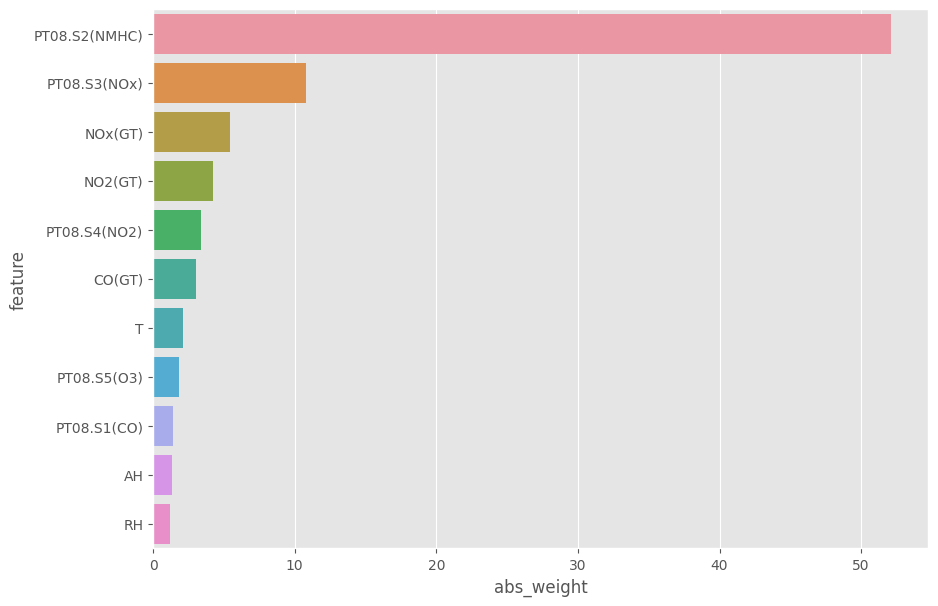

In [ ]:
plot_importance(model.fit(train_x, train_y),train_x.columns)

The most important feature us PT08.S2(NMHC), as it is expected from the high correlation wiht the target variable.

In [ ]:
gs = GridSearchCV(
    ElasticNet(),
    {
      'alpha': np.linspace(0,300,10),
      'l1_ratio': np.arange(0,1.1,0.1)
    },
    n_jobs=-1,
    scoring=['neg_mean_squared_error', 'r2'],
    refit='neg_mean_squared_error',
    cv = TimeSeriesSplit()
)

In [ ]:
gs.fit(train_x, train_y)

GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
             estimator=ElasticNet(), n_jobs=-1,
             param_grid={'alpha': array([  0.        ,  33.33333333,  66.66666667, 100.        ,
       133.33333333, 166.66666667, 200.        , 233.33333333,
       266.66666667, 300.        ]),
                         'l1_ratio': array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ])},
             refit='neg_mean_squared_error',
             scoring=['neg_mean_squared_error', 'r2'])

In [ ]:
metric_df_en, cols_en = evaluate_model(train_x, train_y, test_x, test_y, gs.best_estimator_)

Cross-validated mean score: 0.9644259252806603
Cross-validated scores: [0.96020594 0.98210569 0.97349848 0.97677905 0.92954047]
Test_score: 0.9110828556980741


In [ ]:
metric_df_en

,CV RMSE,Test RMSE,CV MAE,Test MAE,CV R2,Test R2
0,1.431874,1.942653,1.055147,1.672412,0.964163,0.911083


After hypertuning, we receiving very similar values with ElasticNet as with the basic LinearRegression model.

## Statistics material used (residual analysis, factor-importance hypothesis testing): (10%)

In [ ]:
def plotResiduals(train_x, train_y, test_x, test_y, gs):
  residuals_test = gs.best_estimator_.predict(test_x) - test_y
  residuals_train = gs.best_estimator_.predict(train_x) - train_y
  print(f'Normality: p-value for train data = {normaltest(residuals_train)[1]}, for test data = {normaltest(residuals_test)[1]}')

  plt.scatter(x=gs.best_estimator_.predict(train_x), y=residuals_train, alpha=0.3)
  plt.scatter(x=gs.best_estimator_.predict(test_x), y=residuals_test, alpha=0.3)
  plt.axhline(y=0, c='black')
  plt.title('Residuals plot')

Normality: p-value for train data = 0.0, for test data = 0.00019926997491476528


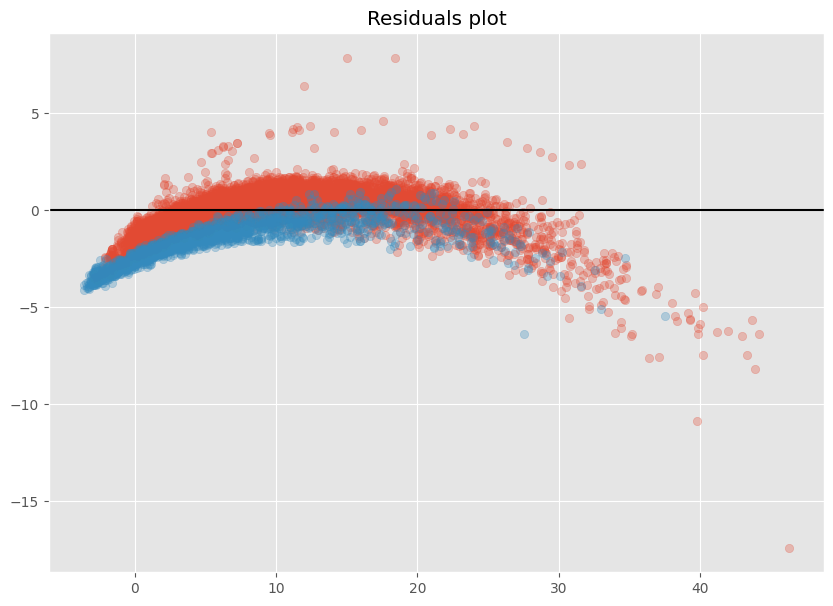

In [ ]:
plotResiduals(train_x, train_y, test_x, test_y, gs)

We can see an inverted U shapes residual plot. So I try it with 2nd grade polynomial transformation

In [ ]:
polynom = PolynomialFeatures(2).fit(train_x)
train_x_pol = pd.DataFrame(polynom.transform(train_x))
test_x_pol = pd.DataFrame(polynom.transform(test_x))

In [ ]:
gs_ridge = GridSearchCV(
    Ridge(),
    {
      'alpha': np.linspace(0,100,10)
    },
    n_jobs=-1,
    scoring=['explained_variance','neg_mean_squared_error', 'r2'],
    refit='neg_mean_squared_error',
    cv = TimeSeriesSplit()
)

In [ ]:
gs_ridge.fit(train_x_pol, train_y)

GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
             estimator=Ridge(), n_jobs=-1,
             param_grid={'alpha': array([  0.        ,  11.11111111,  22.22222222,  33.33333333,
        44.44444444,  55.55555556,  66.66666667,  77.77777778,
        88.88888889, 100.        ])},
             refit='neg_mean_squared_error',
             scoring=['explained_variance', 'neg_mean_squared_error', 'r2'])

In [ ]:
metric_df_ridge, cols_ridge = evaluate_model(train_x_pol, train_y, test_x_pol, test_y, gs_ridge.best_estimator_)

Cross-validated mean score: 0.9998838840889999
Cross-validated scores: [0.99984642 0.9999189  0.99991033 0.99992799 0.99981578]
Test_score: 0.9998175999140977


In [ ]:
metric_df_ridge

,CV RMSE,Test RMSE,CV MAE,Test MAE,CV R2,Test R2
0,0.080551,0.087986,0.054847,0.065929,0.999887,0.999818


2nd grade polynoms and Ridge model gives much higher score, and lower errors.

Normality: p-value for train data = 1.6910461433558166e-197, for test data = 3.0669134045823163e-18


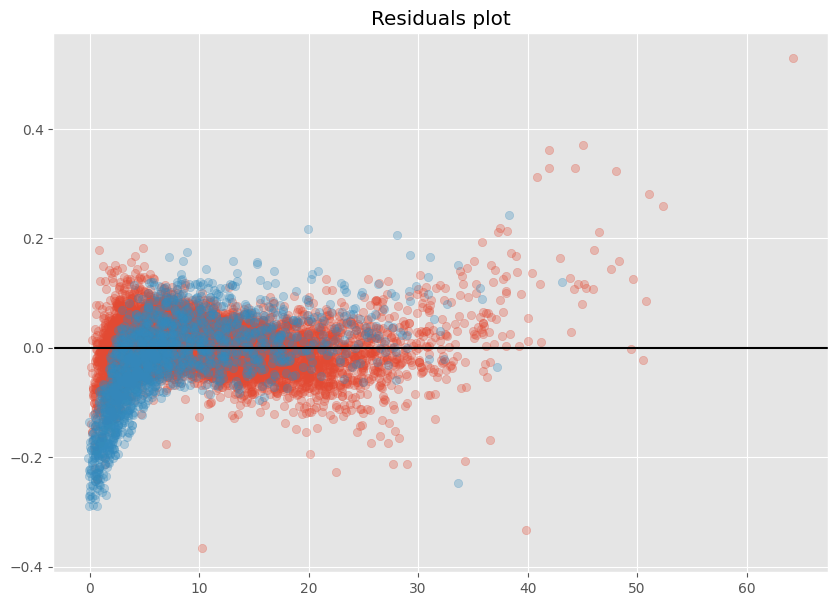

In [ ]:
plotResiduals(train_x_pol, train_y, test_x_pol, test_y, gs_ridge)

Residual plot still shows a higher grade of polynomial function.

In [ ]:
polynom = PolynomialFeatures(3).fit(train_x)
train_x_pol3 = pd.DataFrame(polynom.transform(train_x))
test_x_pol3 = pd.DataFrame(polynom.transform(test_x))

In [ ]:
gs_ridge.fit(train_x_pol3, train_y)

GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
             estimator=Ridge(), n_jobs=-1,
             param_grid={'alpha': array([  0.        ,  11.11111111,  22.22222222,  33.33333333,
        44.44444444,  55.55555556,  66.66666667,  77.77777778,
        88.88888889, 100.        ])},
             refit='neg_mean_squared_error',
             scoring=['explained_variance', 'neg_mean_squared_error', 'r2'])

In [ ]:
metric_df_ridge3, cols_ridge3 = evaluate_model(train_x_pol3, train_y, test_x_pol3, test_y, gs_ridge.best_estimator_)

Cross-validated mean score: 0.999950202566732
Cross-validated scores: [0.99996718 0.99997644 0.99995979 0.99998013 0.99986747]
Test_score: 0.9999574093467356


In [ ]:
metric_df_ridge3

,CV RMSE,Test RMSE,CV MAE,Test MAE,CV R2,Test R2
0,0.05366,0.042517,0.033919,0.031628,0.99995,0.999957


Normality: p-value for train data = 9.153737779519909e-211, for test data = 0.0


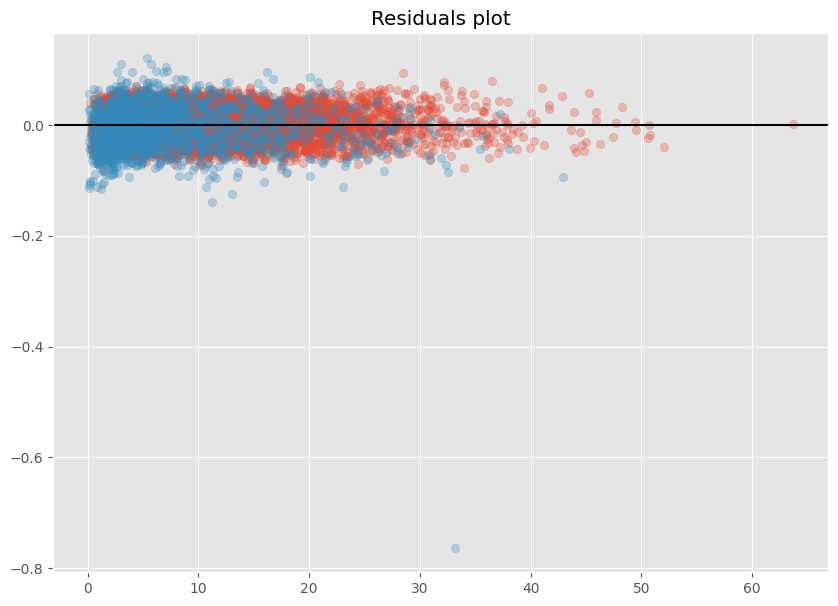

In [ ]:
plotResiduals(train_x_pol3, train_y, test_x_pol3, test_y, gs_ridge)

With 3rd grade polynomial features, the results are even better. Residuals are evenly distributed.